In [1]:
import pickle
import numpy as np
import torch
from torch import nn
from matplotlib import pyplot as plt
from matplotlib import ticker
from datetime import datetime, timezone
from scipy import ndimage
import pandas as pd

from Modules import GetRootPath, RadMonitorDataLoader, FluxParametersToCounts, FluxToCounts, DiffFluxReconstructor

### Loading the count rate data measured by RADEM during the most intense SEP events of the first coincidence configuratin of RADEM

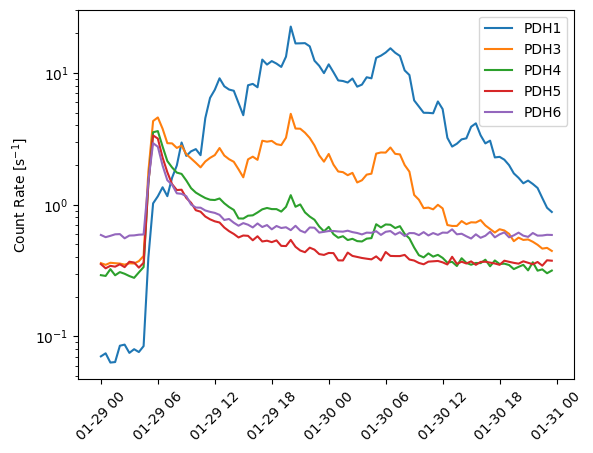

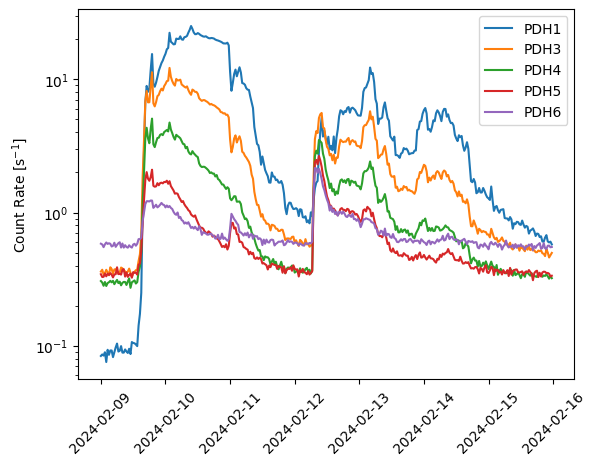

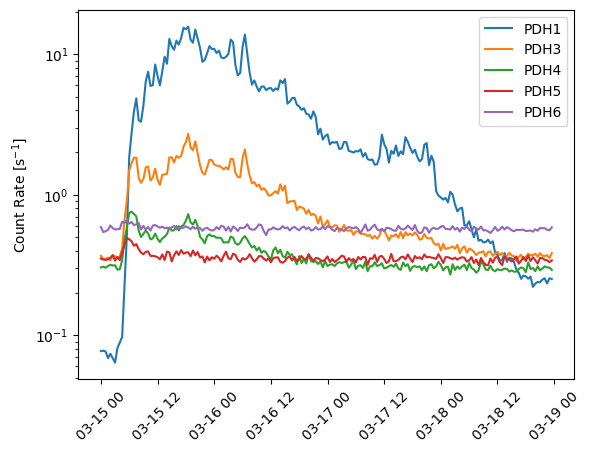

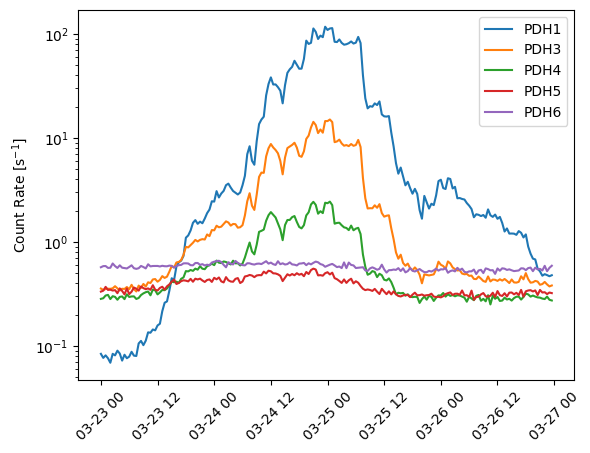

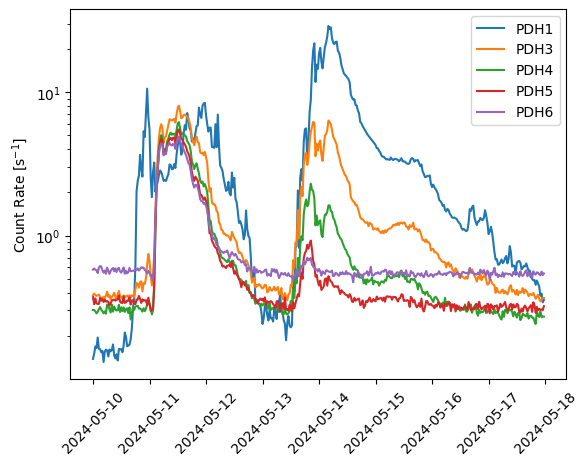

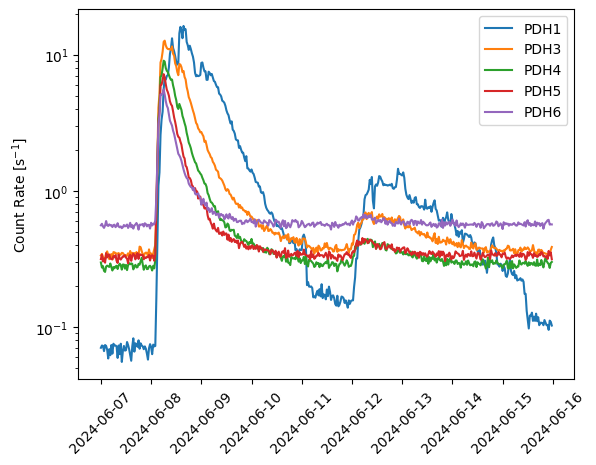

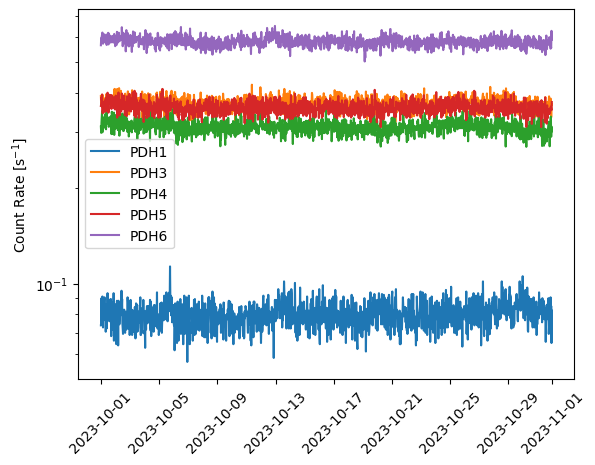

Bkg Mean
PROTONS_1    0.080055
PROTONS_3    0.369770
PROTONS_4    0.312122
PROTONS_5    0.359193
PROTONS_6    0.579941
dtype: float64
-----------------------------------------
Bkg Standard Deviation
PROTONS_1    0.007101
PROTONS_3    0.015451
PROTONS_4    0.013940
PROTONS_5    0.015302
PROTONS_6    0.019839
dtype: float64
-----------------------------------------


In [2]:
keys = ["PROTONS"]
timeStep = 30 # Minutes
# Defining the time intervals of the SEP events
listSEPDates = [
    [datetime(2024, 1, 29), datetime(2024, 1, 31)],
    [datetime(2024, 2, 9), datetime(2024, 2, 16)],
    [datetime(2024, 3, 15), datetime(2024, 3, 19)],
    [datetime(2024, 3, 23), datetime(2024, 3, 27)],
    [datetime(2024, 5, 10), datetime(2024, 5, 18)],
    [datetime(2024, 6, 7), datetime(2024, 6, 16)]
]

#####################################################################################
# Loading the count rates used by the machine learning model into a pandas DataFrame
#####################################################################################
listSEPData = []
for i in range(len(listSEPDates)):
    dataSEPLoader = RadMonitorDataLoader()
    dataSEPLoader.LoadCDFFiles(keys, *listSEPDates[i])
    listSEPData.append(dataSEPLoader.dataFrames["PROTONS"])


# Choosing the detection bins that are used by the model
detectionBinsList = [1, 3, 4, 5, 6]
detectionBinsNameList = [f"PROTONS_{detectionBins}" for detectionBins in detectionBinsList]
for i in range(len(listSEPData)):
    listSEPData[i] = listSEPData[i].loc[:, detectionBinsNameList]
    # Re-binning the count rates to 1 point every 15 minutes
    listSEPData[i] = listSEPData[i].resample(f"{timeStep}min").mean()
    # From counts/min to counts/sec
    listSEPData[i] = listSEPData[i].div(60)

# Plotting the RADEM count rate data
for dataSEP in listSEPData:
    for i, column in enumerate(dataSEP.columns):
        plt.plot(dataSEP.index, dataSEP[column], label=f"PDH{detectionBinsList[i]}")
        plt.xticks(rotation=45)
        plt.yscale("log")
    plt.ylabel(r"Count Rate [s$^{-1}$]")
    plt.legend()
    plt.show()

# Loading the background of the detection bins
dataBkgLoader = RadMonitorDataLoader()
dataBkgLoader.LoadCDFFiles(keys, datetime(2023, 10, 1), datetime(2023, 11, 1))
dataBkg = dataBkgLoader.dataFrames["PROTONS"]
dataBkg = dataBkg.loc[:, detectionBinsNameList]
dataBkg = dataBkg.resample(f"{timeStep}min").mean()
dataBkg = dataBkg.div(60)

# Plotting the background
for i, column in enumerate(dataBkg.columns):
    plt.plot(dataBkg.index, dataBkg[column], label=f"PDH{detectionBinsList[i]}")
    plt.xticks(rotation=45)
    plt.yscale("log")
plt.ylabel(r"Count Rate [s$^{-1}$]")
plt.legend()
plt.show()

bkgMean = dataBkg.mean(axis=0)
bkgStd = dataBkg.std(axis=0)
print("Bkg Mean")
print(bkgMean)
print("-----------------------------------------")
print("Bkg Standard Deviation")
print(bkgStd)
print("-----------------------------------------")

bkgMean = torch.tensor(bkgMean.to_numpy(), dtype=torch.float32)
bkgStd = torch.tensor(bkgStd.to_numpy(), dtype=torch.float32)

### Using the machine learning model to reconstruct the differential flux spectra from the count rates measured during the SEP events, and creating the plots used in the Article to evaluate the performance of the model

------------------------------------
SEP Event (29/1/2024 - 31/1/2024)
------------------------------------


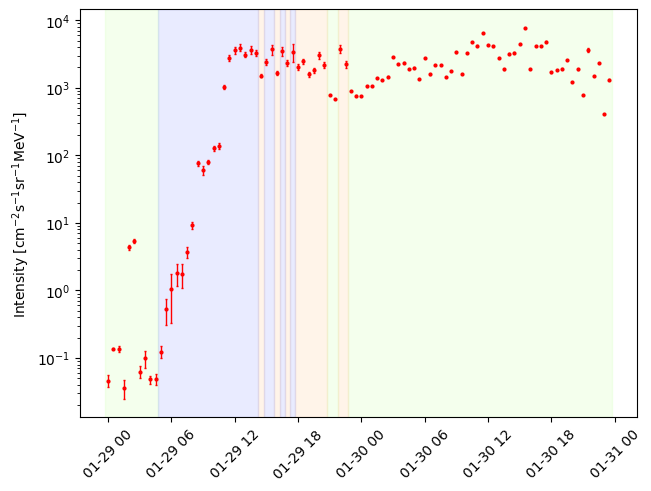

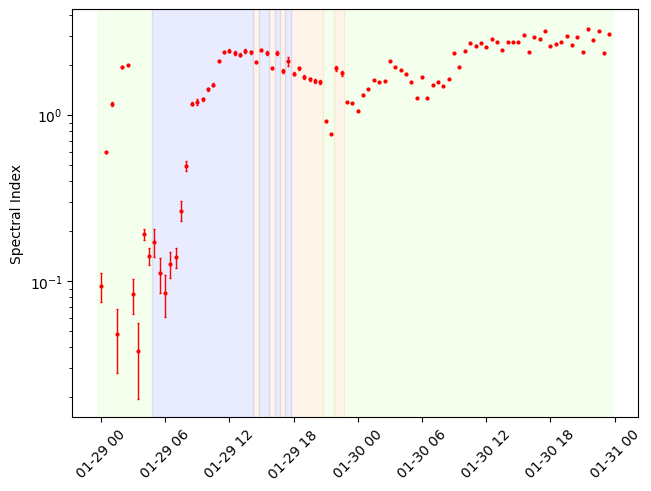

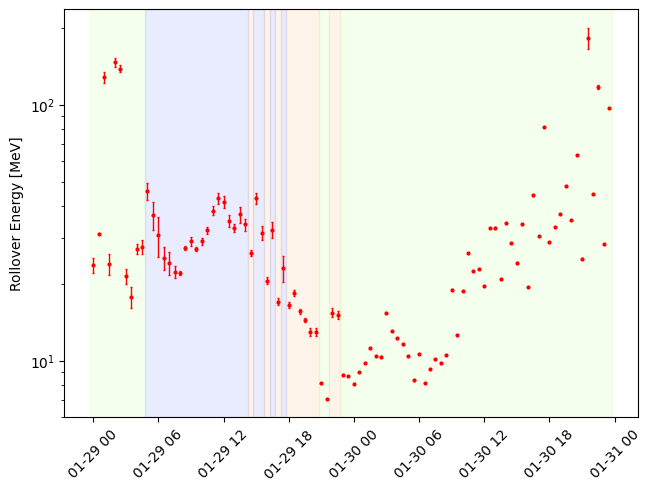

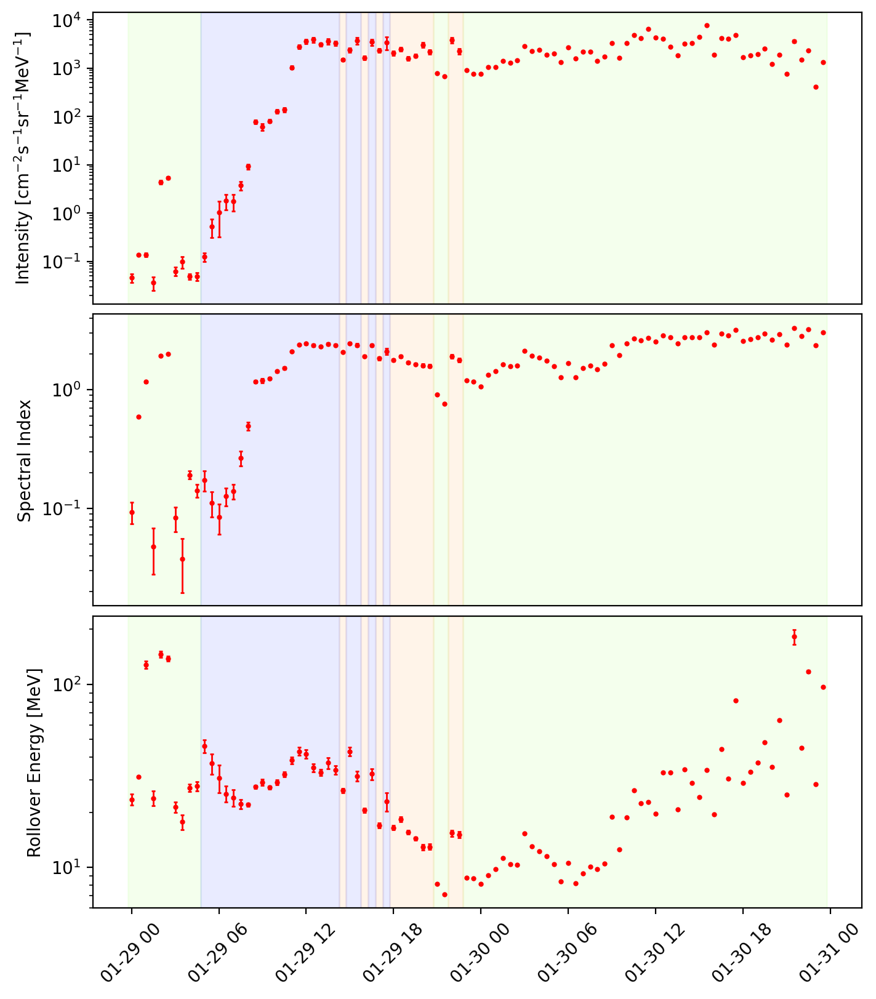

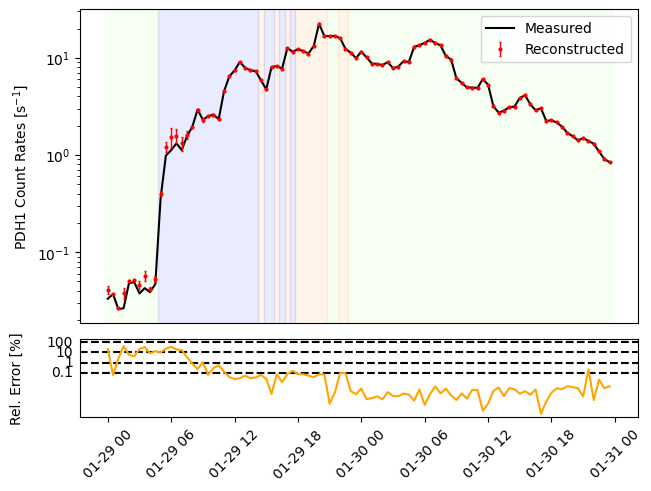

...

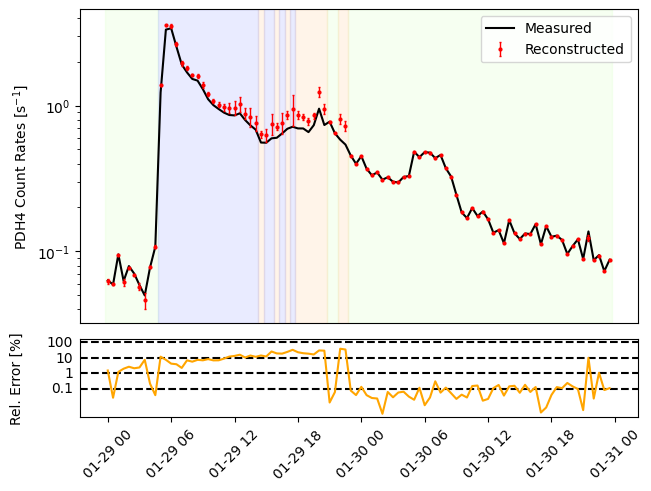

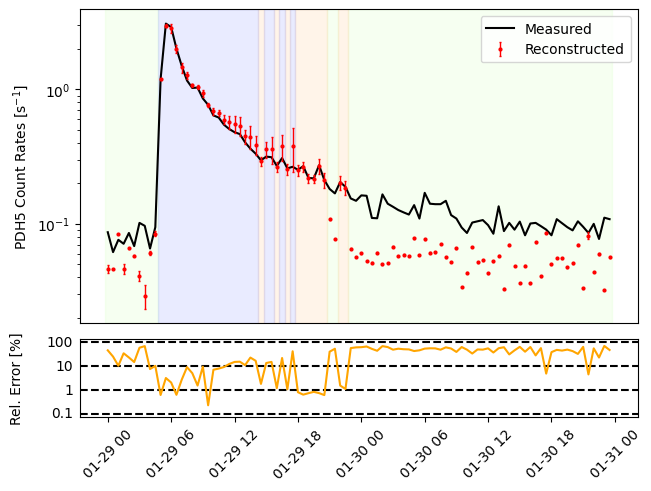

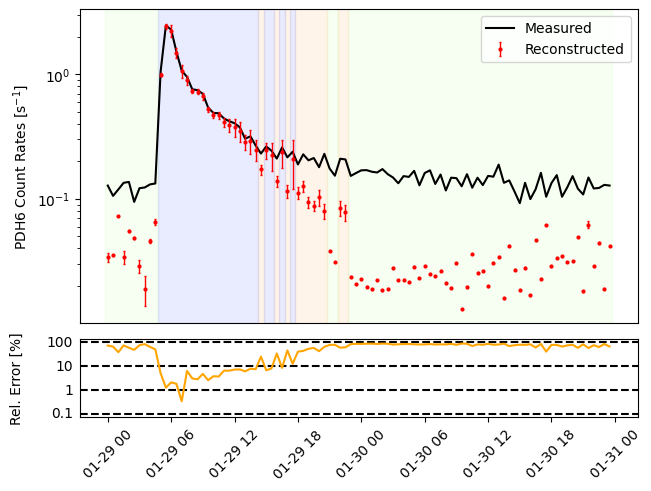

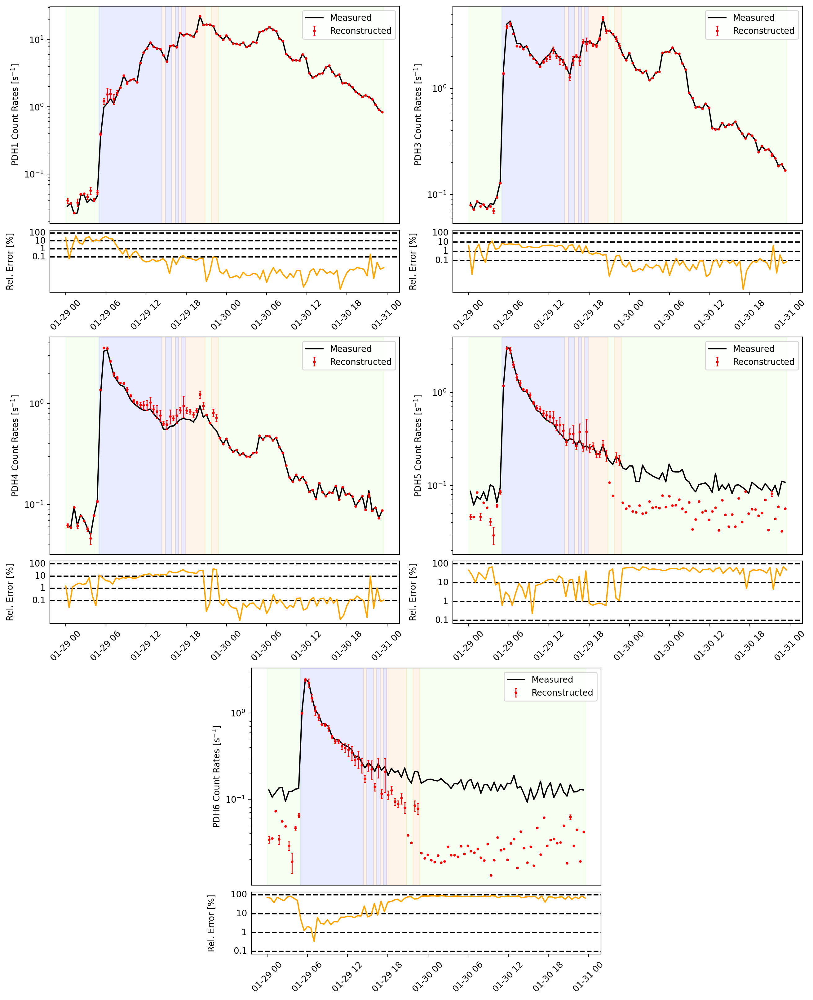

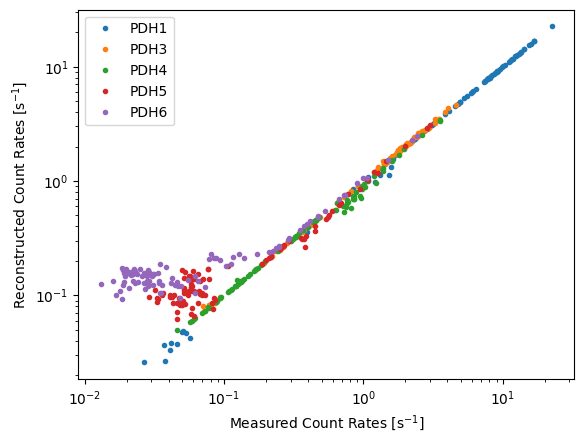

------------------------------------
SEP Event (9/2/2024 - 16/2/2024)
------------------------------------


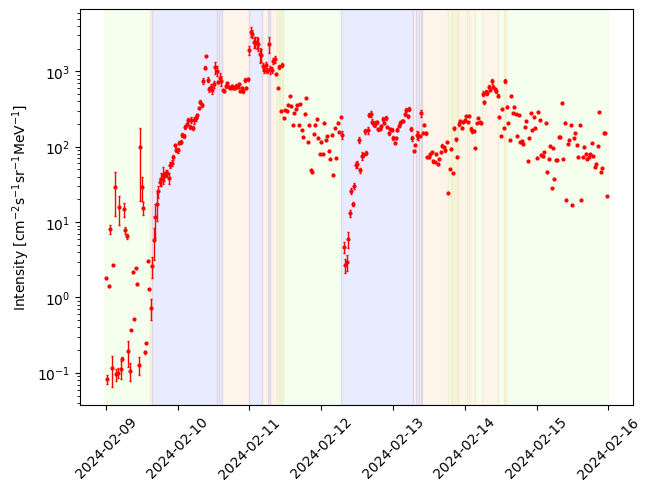

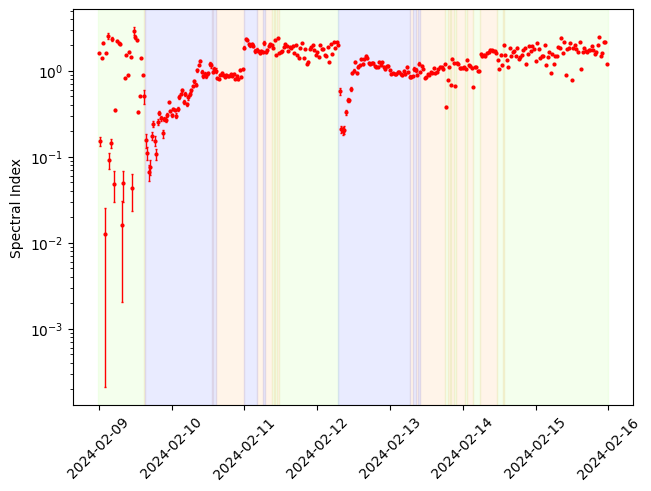

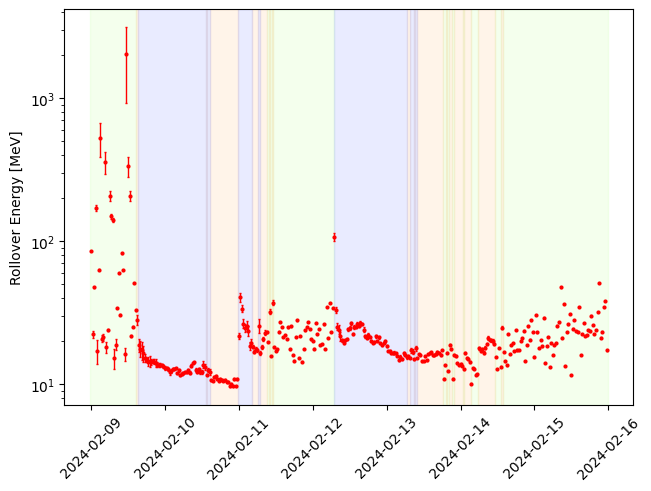

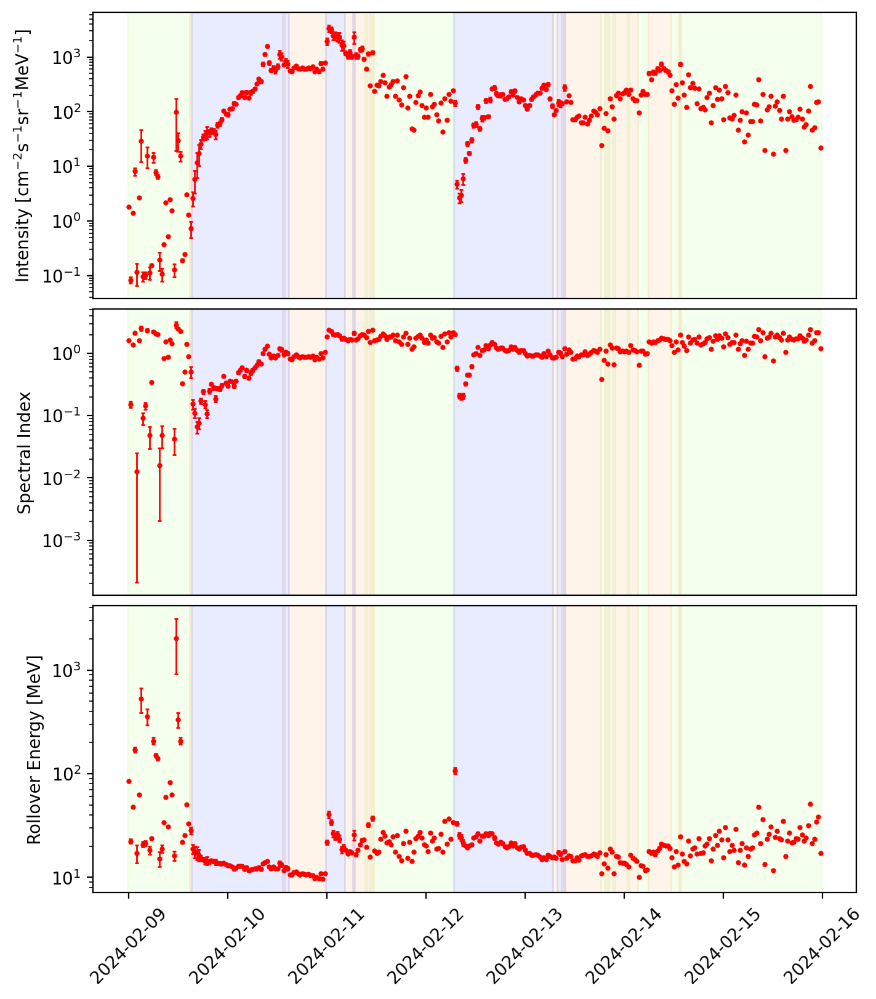

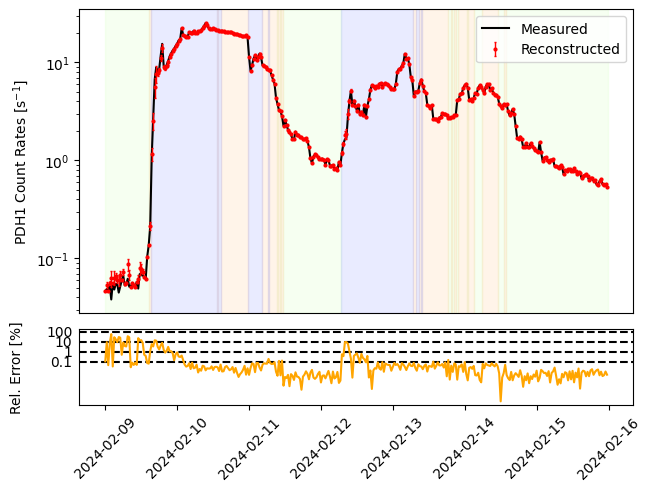

...

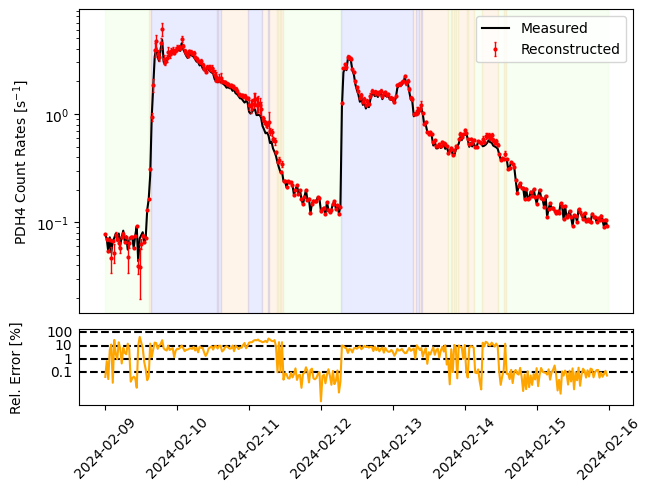

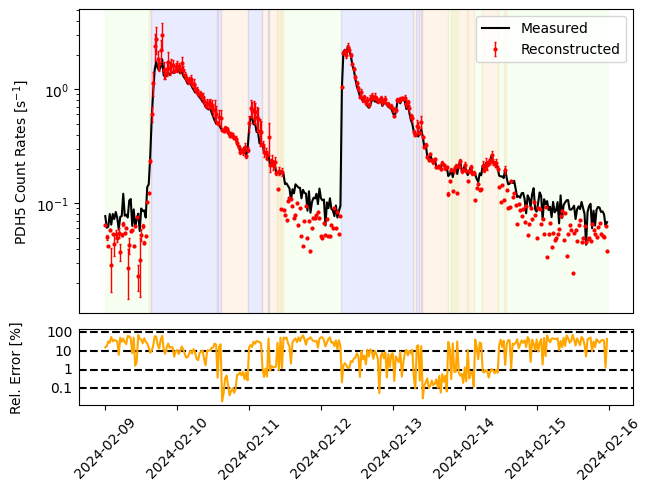

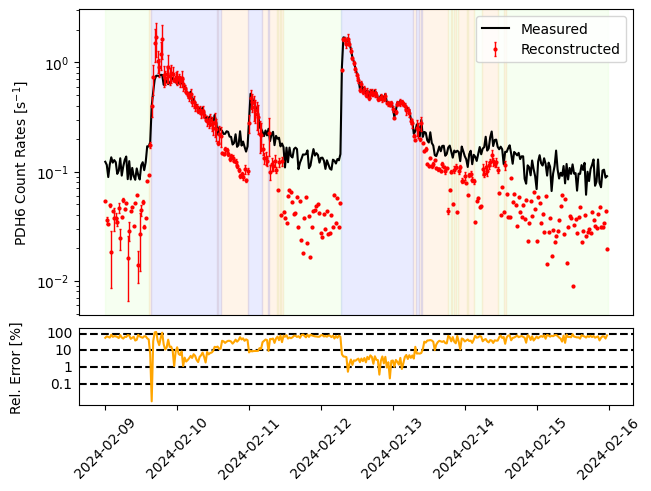

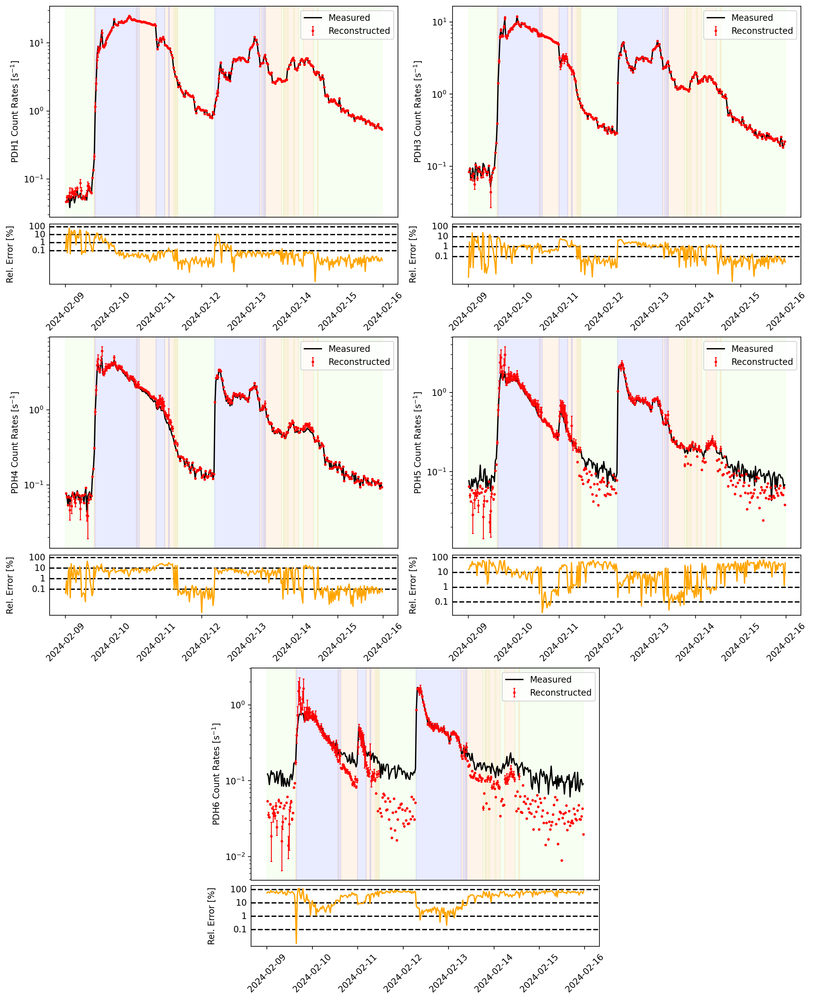

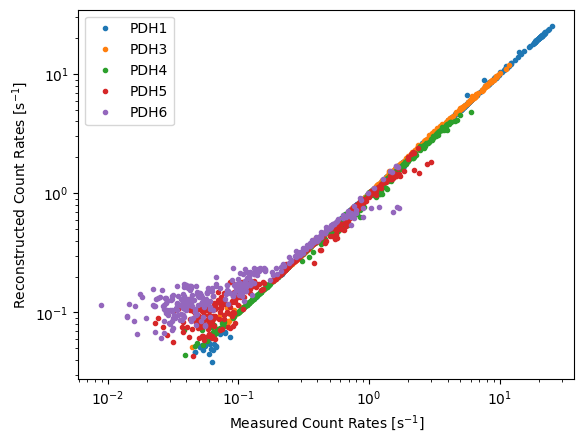

------------------------------------
SEP Event (15/3/2024 - 19/3/2024)
------------------------------------


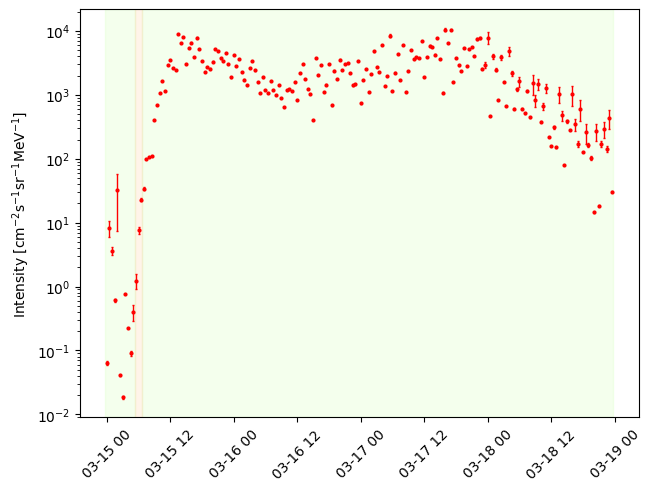

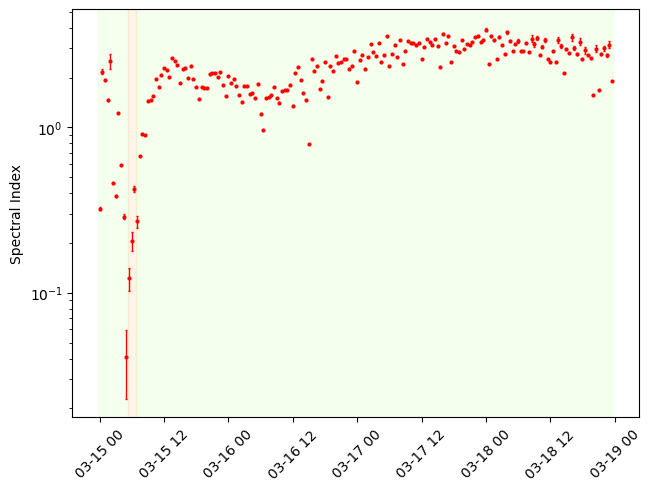

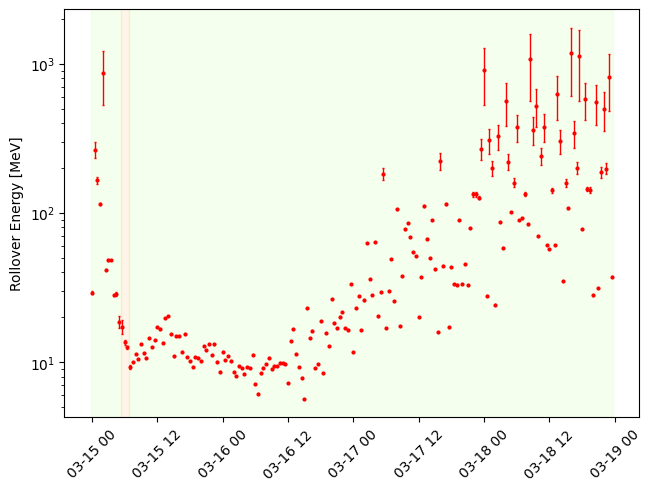

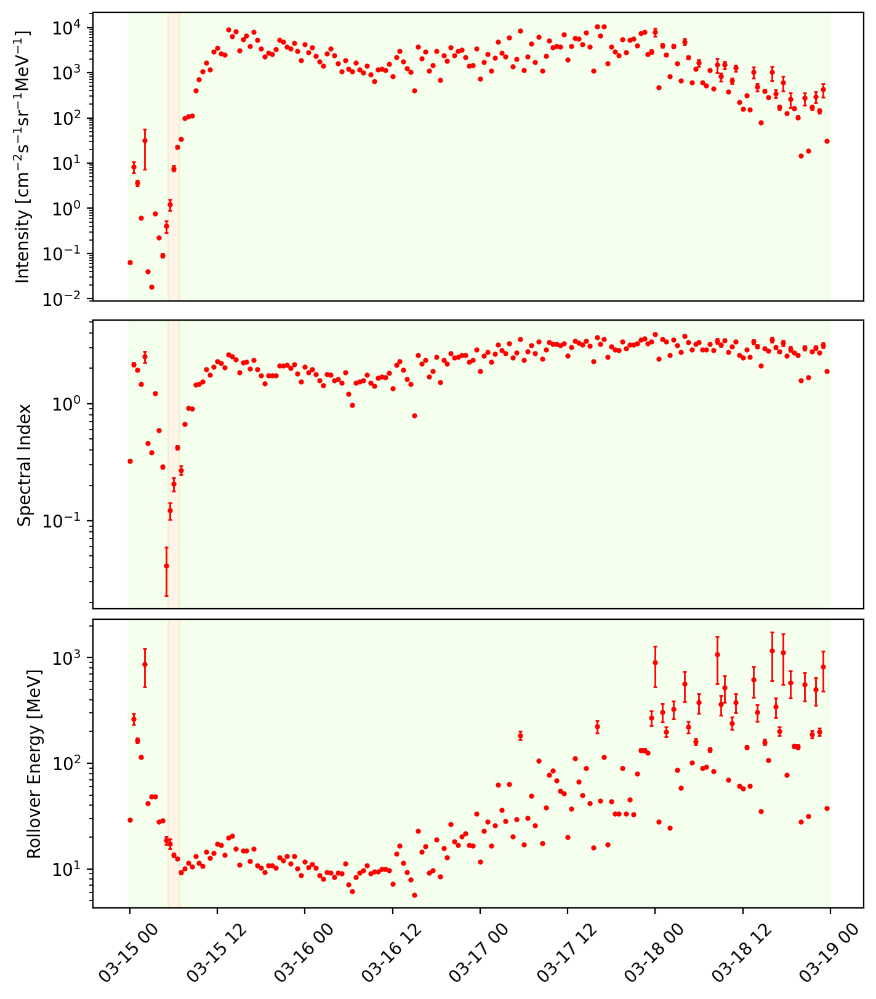

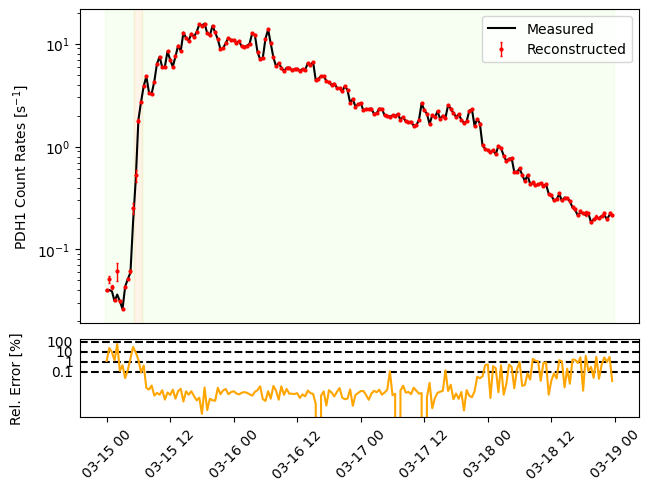

...

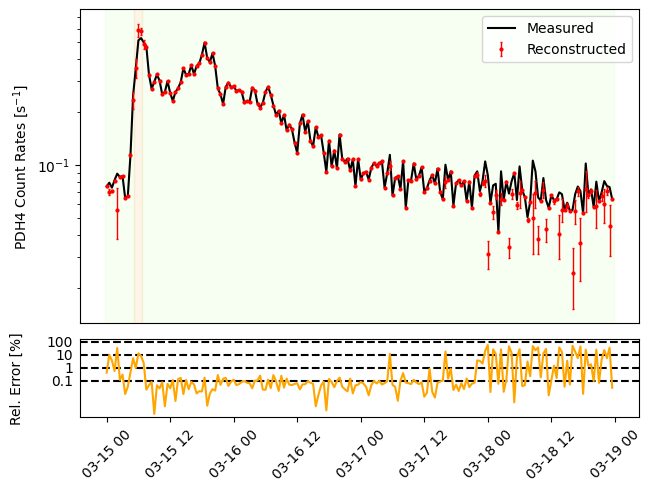

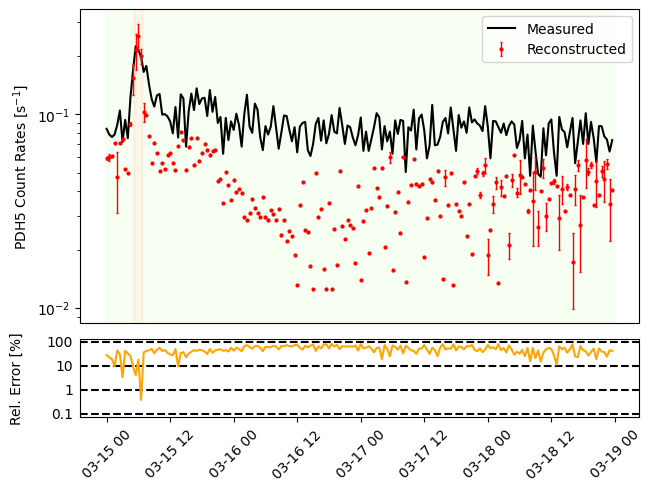

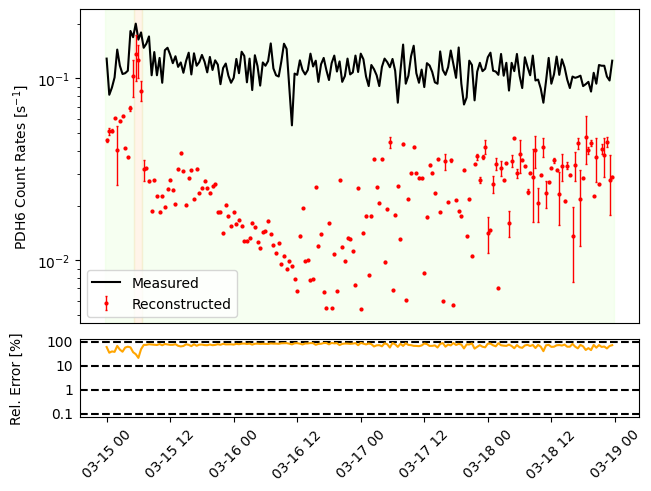

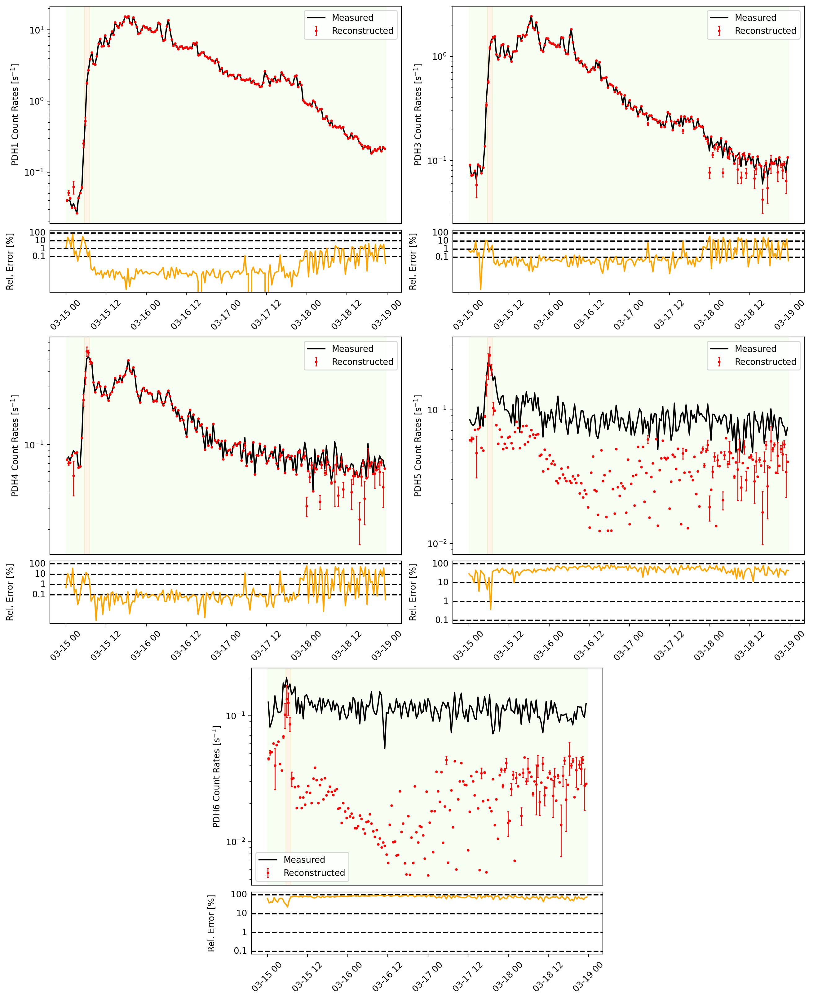

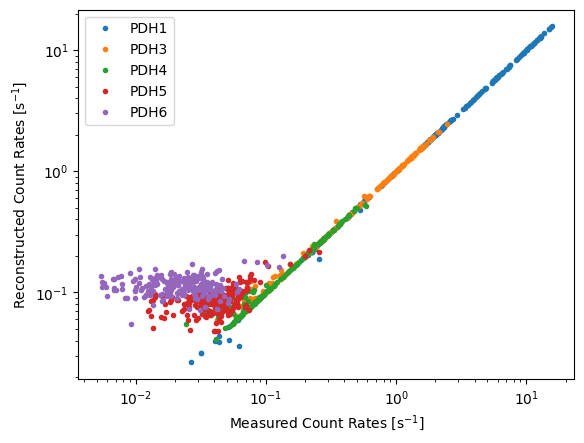

------------------------------------
SEP Event (23/3/2024 - 27/3/2024)
------------------------------------


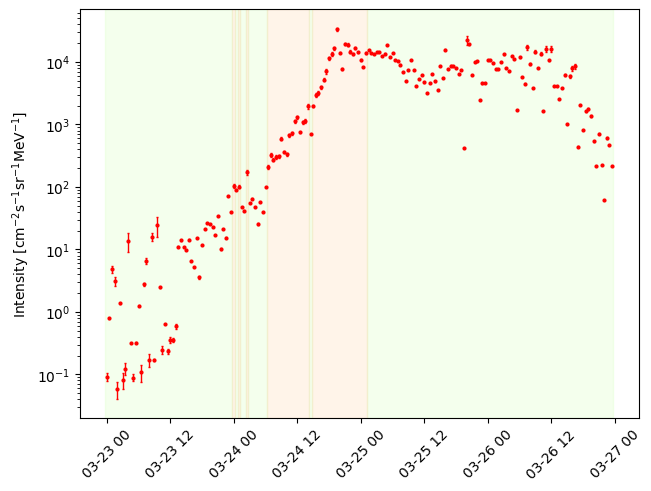

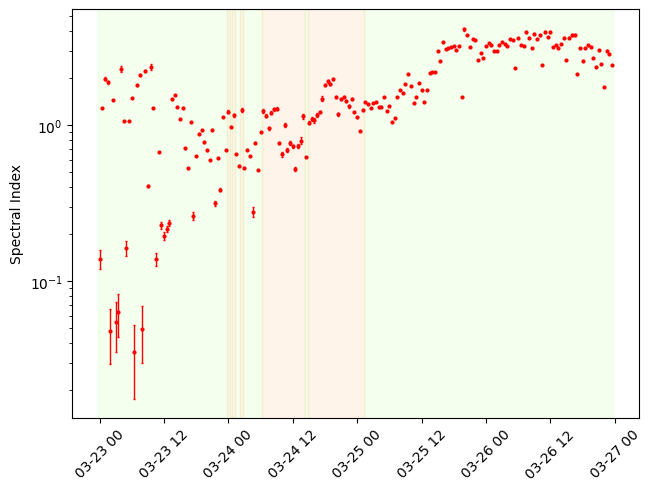

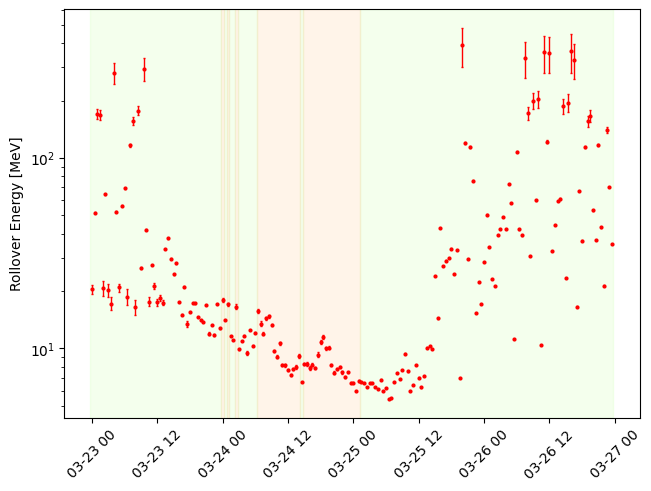

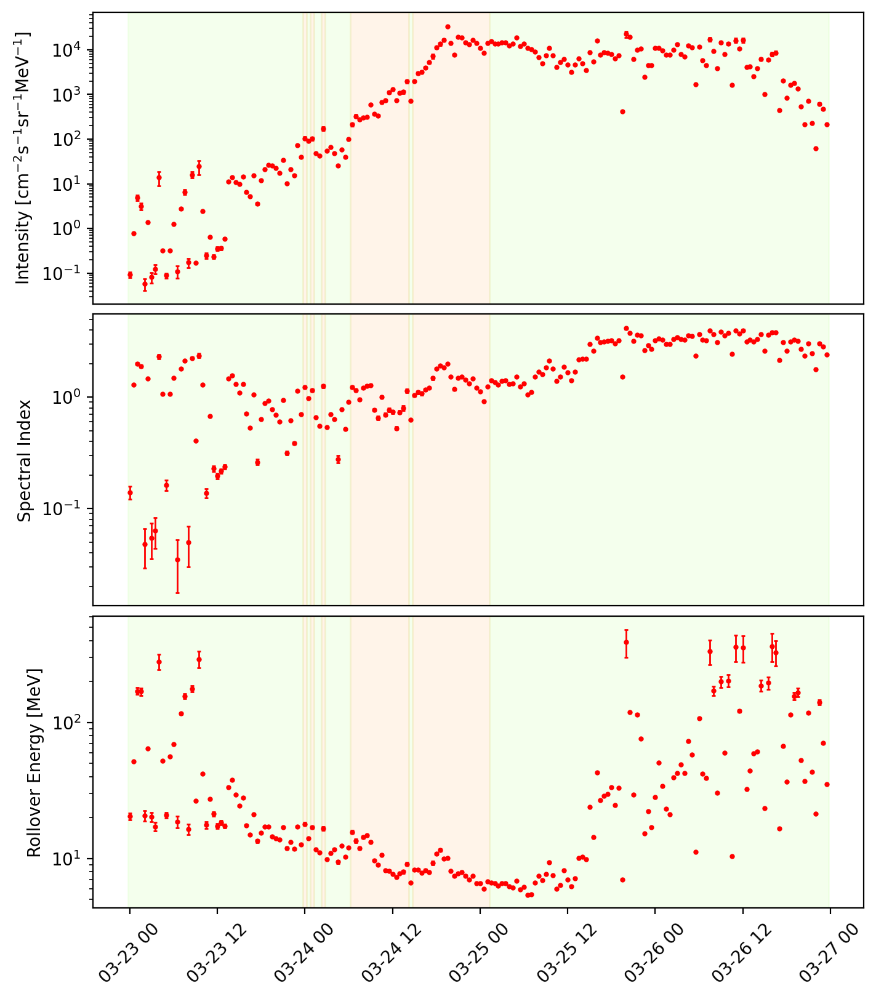

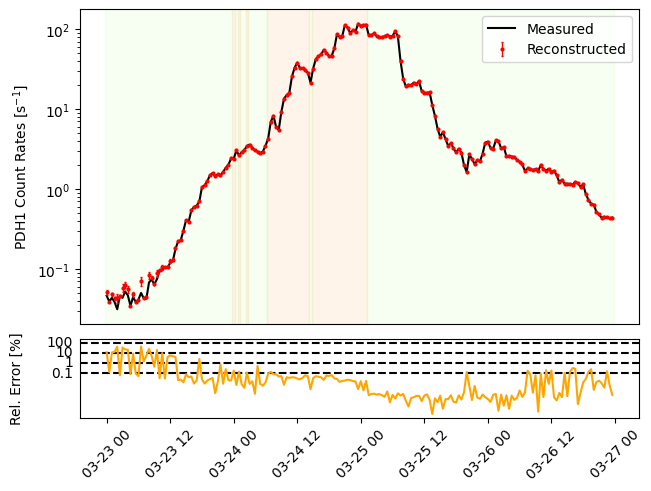

...

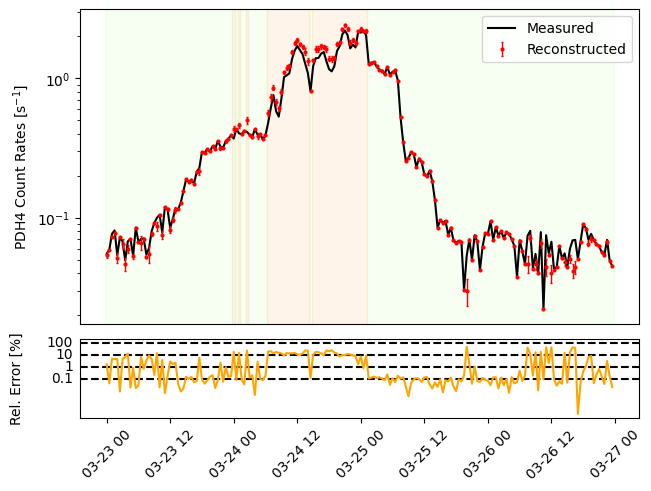

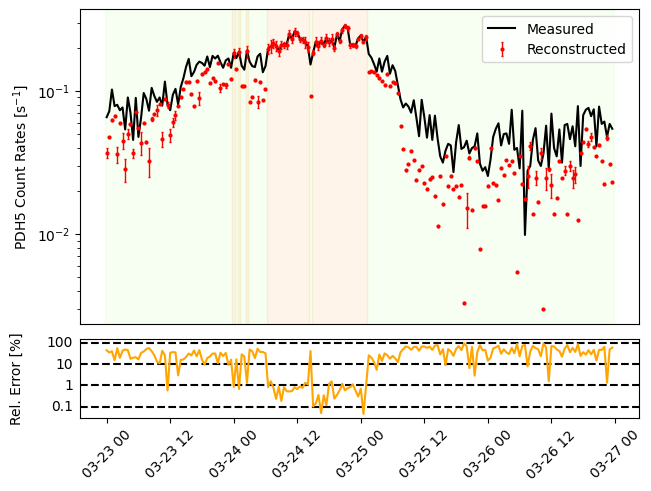

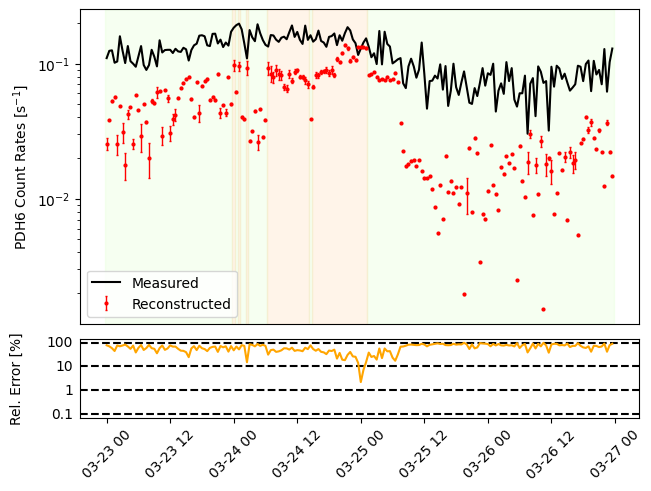

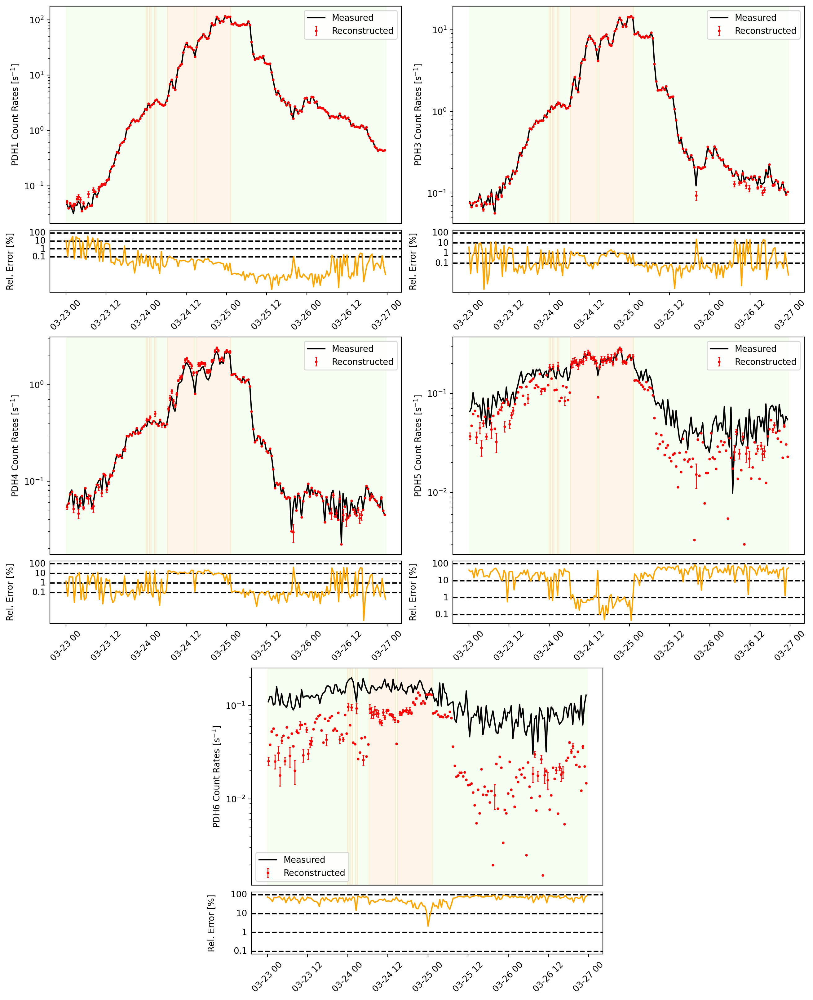

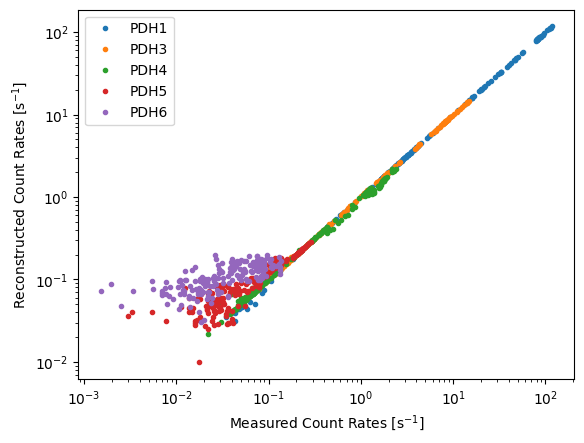

------------------------------------
SEP Event (10/5/2024 - 18/5/2024)
------------------------------------


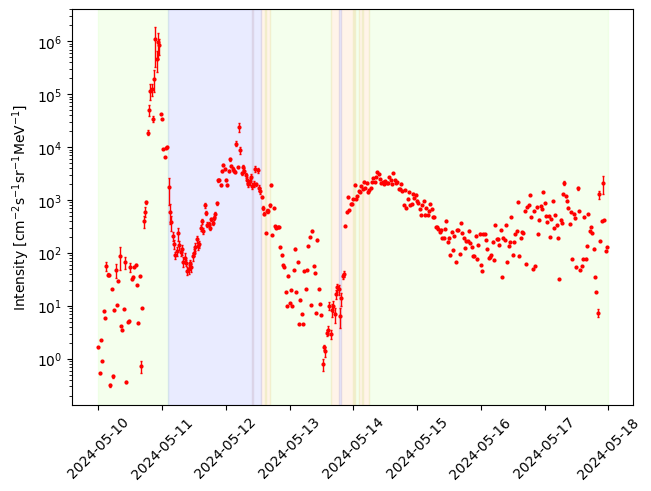

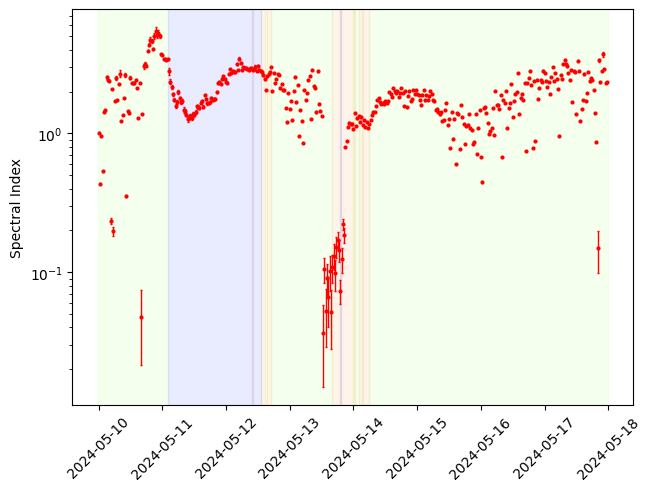

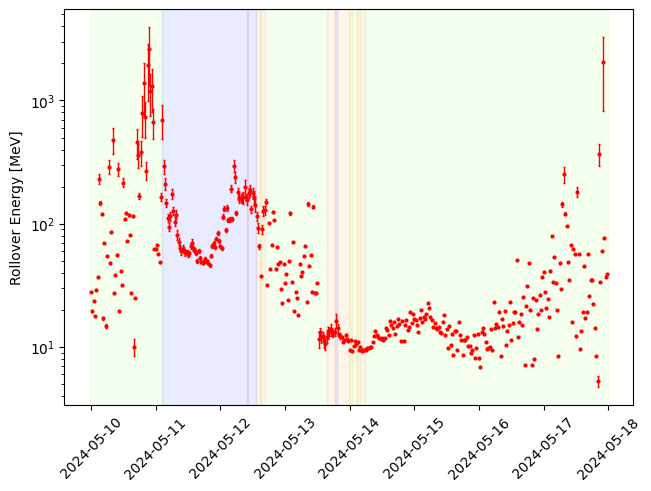

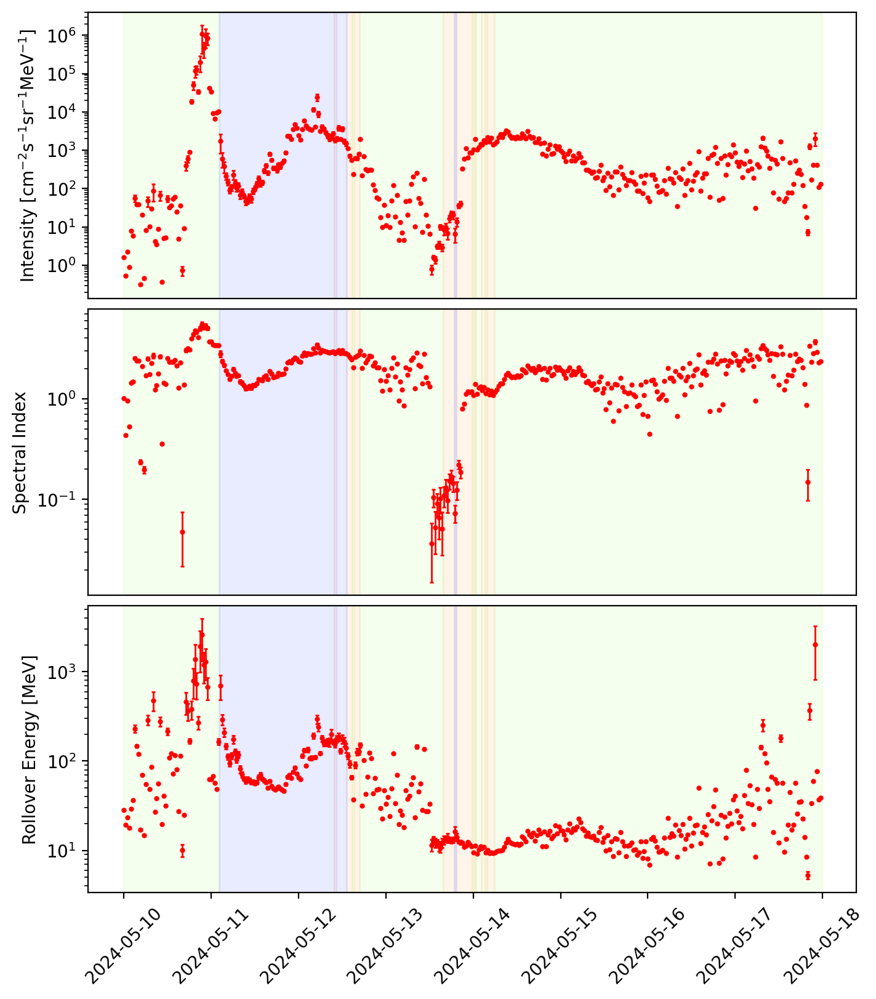

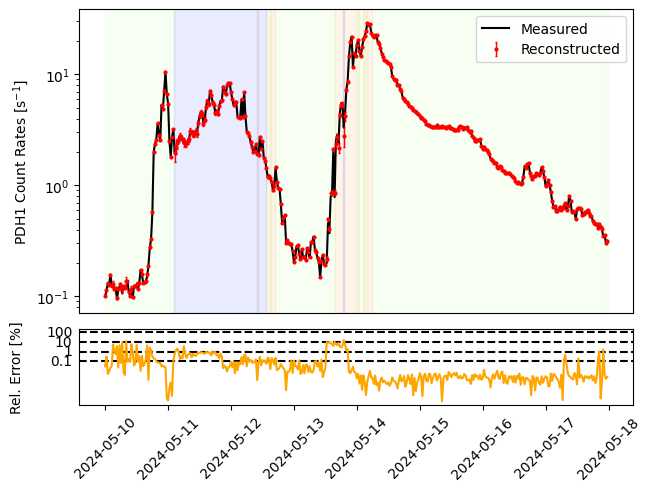

...

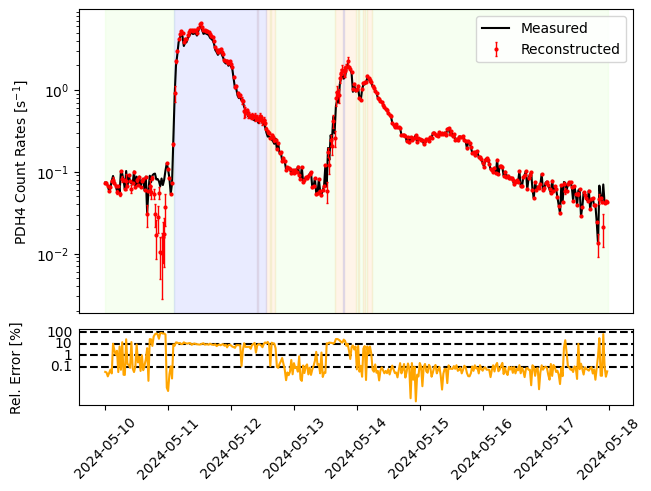

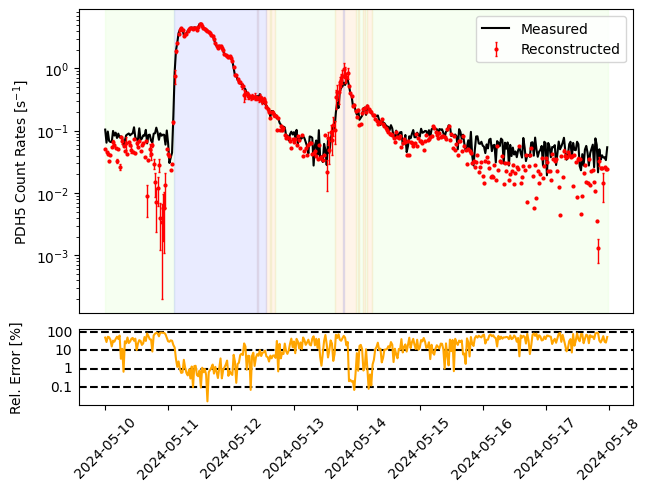

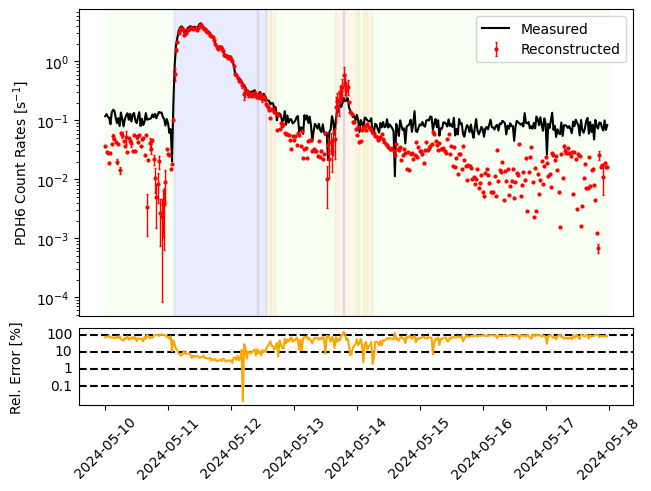

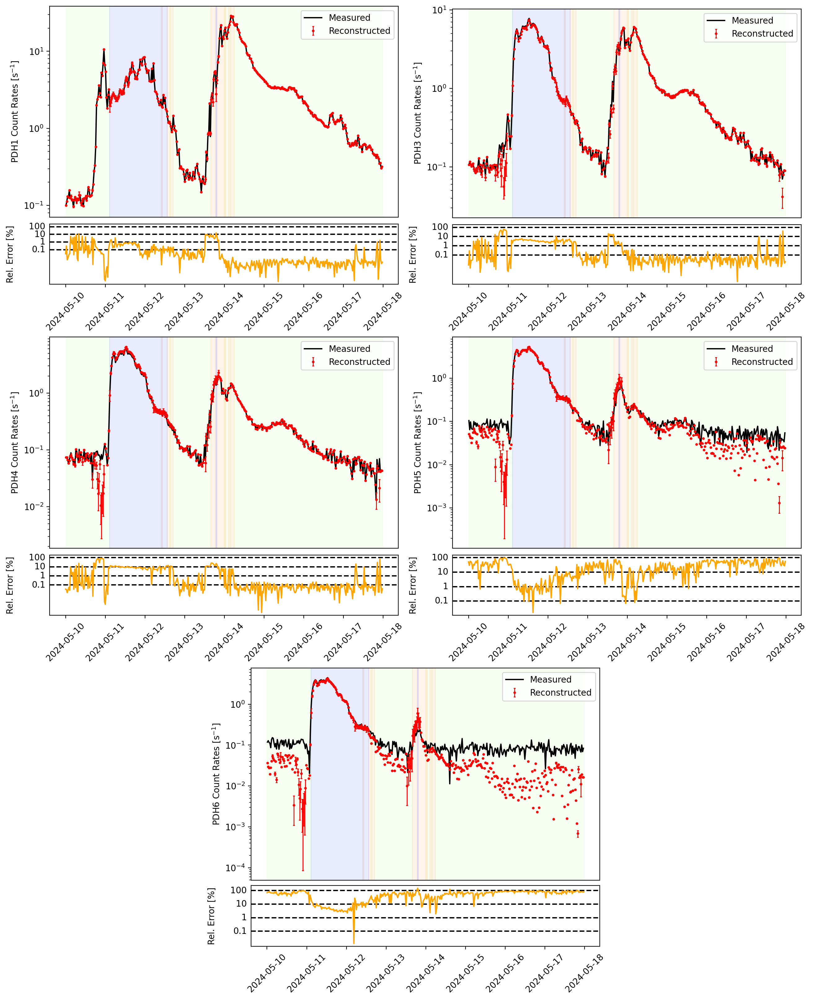

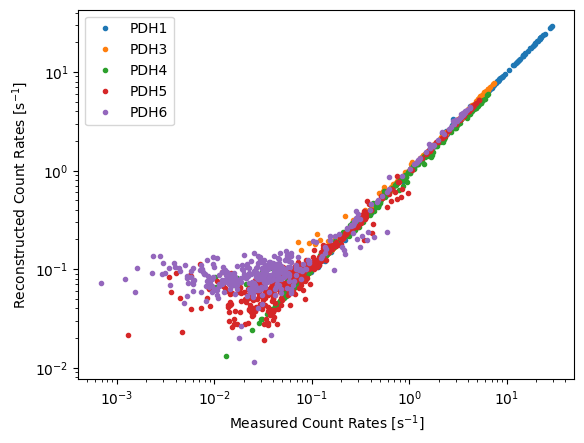

------------------------------------
SEP Event (7/6/2024 - 16/6/2024)
------------------------------------


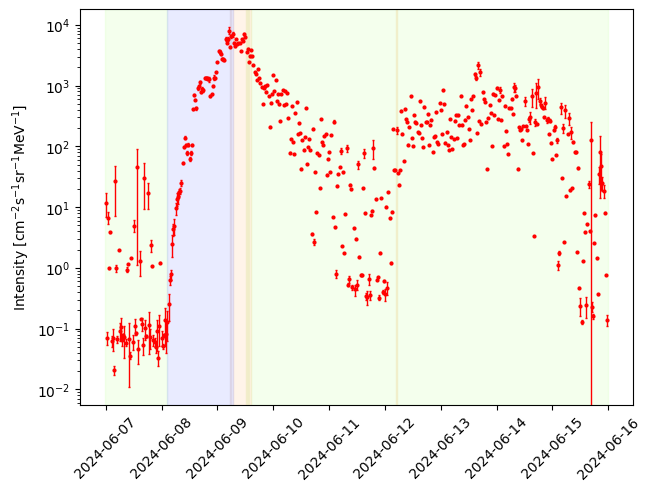

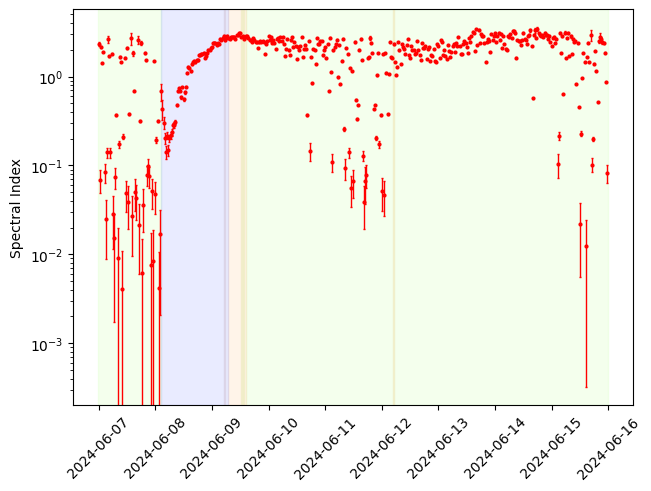

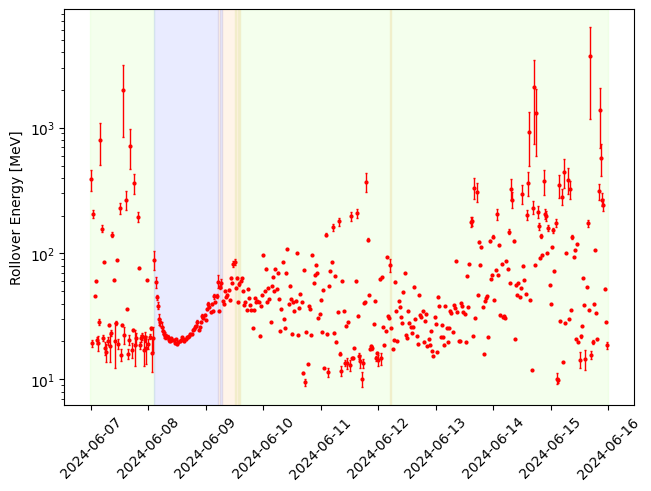

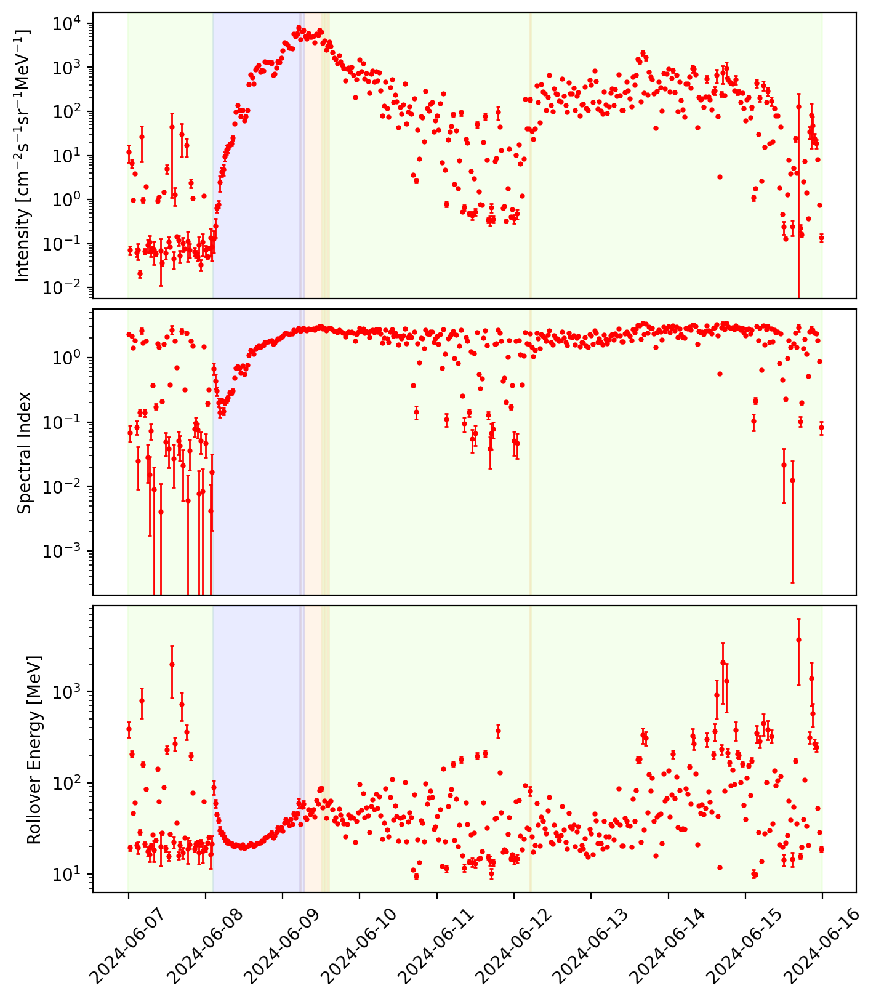

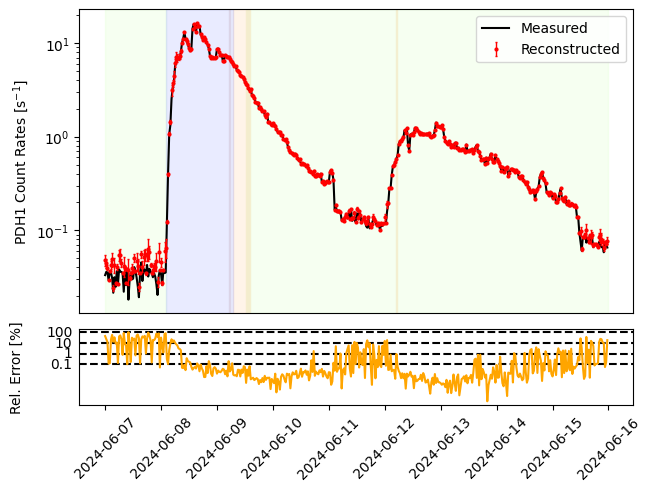

...

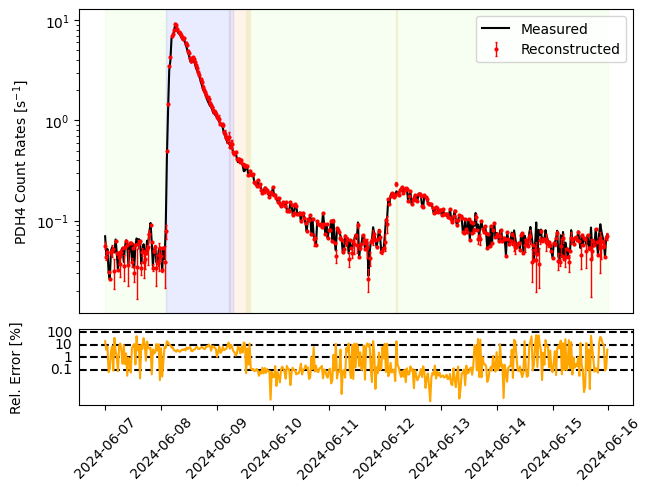

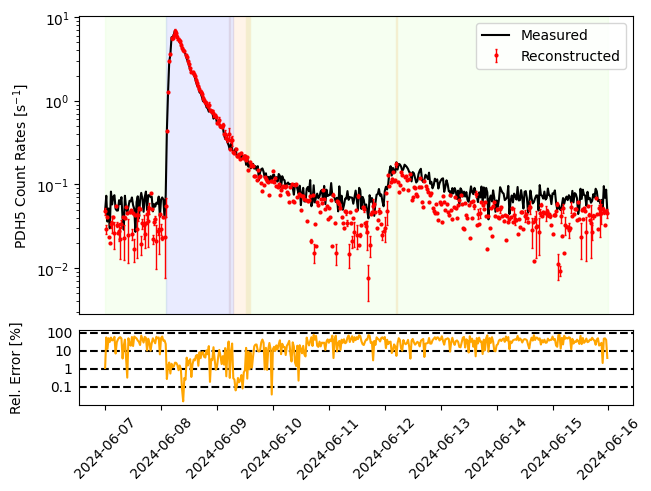

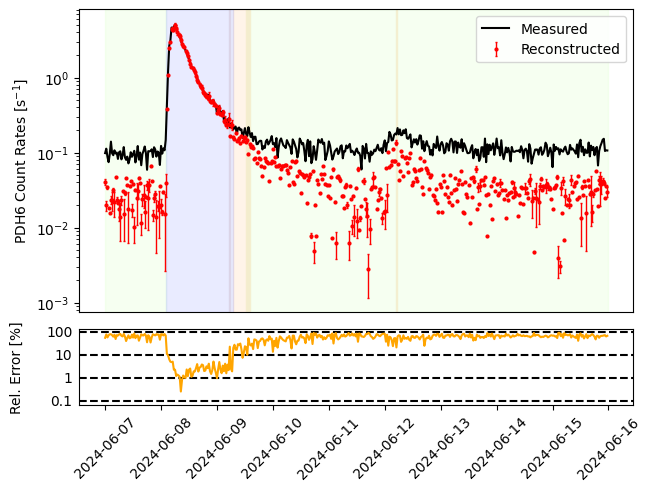

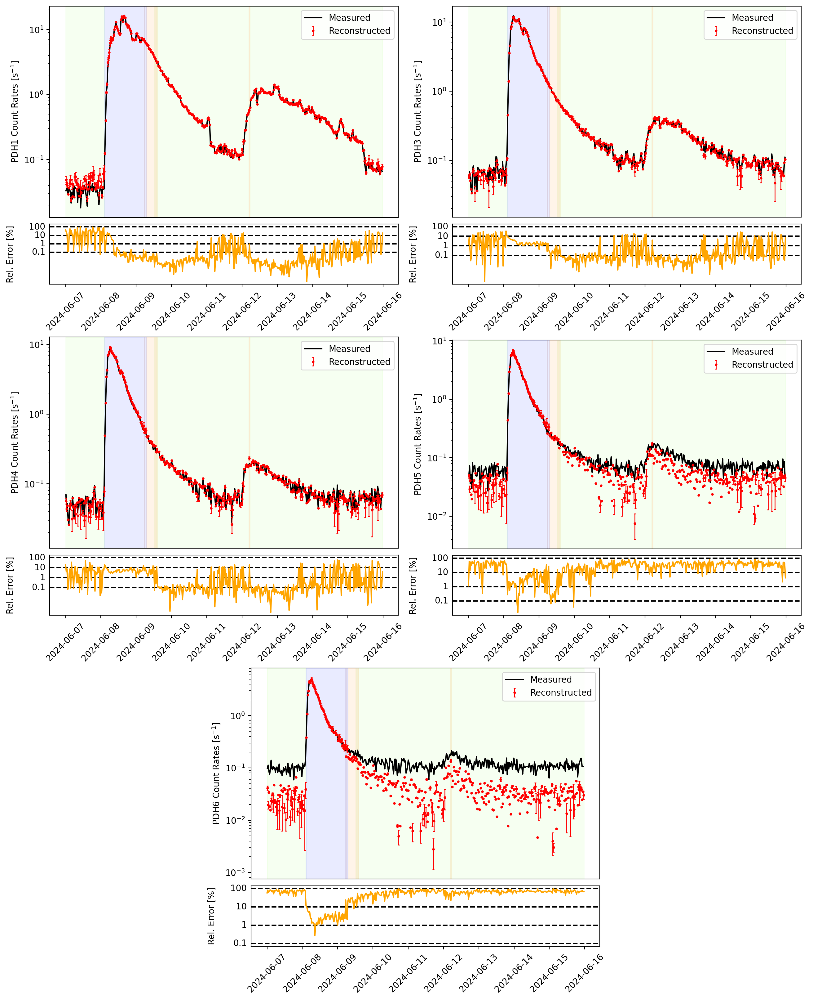

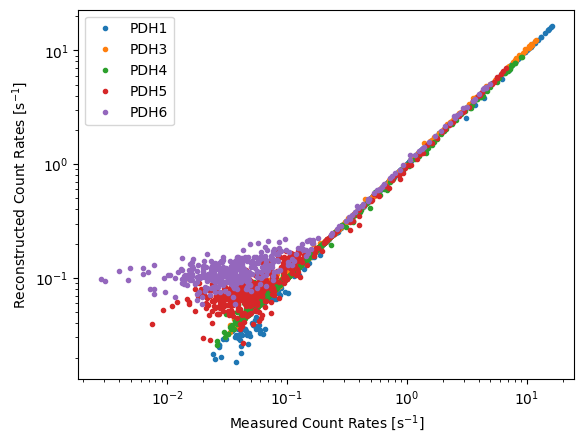

In [3]:
# Defining the function used to shade the time periods in which the different ensembles are used
def ShadeMask(ax, index, mask, color, alpha=0.2):
    mask = mask.numpy().astype(int)
    transitions = np.diff(mask, prepend=0, append=0)
    shadingStarts = np.where(transitions==1)[0]
    shadingEnds = np.where(transitions==-1)[0]

    for (shadingStart, shadingEnd) in zip(shadingStarts, shadingEnds):
        startIndex = index[shadingStart]
        endIndex = index[shadingEnd-1]
        timeStep = index.to_series().diff().iloc[1]
        ax.axvspan(startIndex - timeStep/2, endIndex + timeStep/2, color=color, alpha=alpha)

# Creating a DiffFluxReconstructor object (Machine learning model)
diffFluxReconstructor = DiffFluxReconstructor()
# For loop over the different SEP events
for idx, dataSEP in enumerate(listSEPData):
    # Defining variables used in the following plots
    initialDate = f"{listSEPDates[idx][0].day}-{listSEPDates[idx][0].month}-{listSEPDates[idx][0].year}"
    finalDate = f"{listSEPDates[idx][1].day}-{listSEPDates[idx][1].month}-{listSEPDates[idx][1].year}"
    yLabels = [r"Intensity [cm$^{-2}$s$^{-1}$sr$^{-1}$MeV$^{-1}$]", "Spectral Index", "Rollover Energy [MeV]"]
    targetLabels = ["Intensity", "SpectralIndex", "RolloverEnergy"]

    # Creating a count rates torch tensor and partially removing its background 
    countRates = torch.tensor(dataSEP.to_numpy(), dtype=torch.float32)
    countRates = countRates - bkgMean + 6 * bkgStd
    # Using the machine learning model (DiffFluxReconstructor object) to reconstruct the differential flux spectra
    # from the measured count rates
    # 6 * bkgStd are the new bkg means after this background reduction
    predParameters, predParameterUncertainties, predParameterSamples, maskDict = diffFluxReconstructor(countRates, bkgMean=6*bkgStd)
    # Reconstructing the count rates of the detection bins using the estimated differential flux parameters
    predCountRateSamples = []
    for i in range(predParameterSamples.shape[-1]):
        predCountRateSamples.append(predParameterSamples[:, 0, i].unsqueeze(-1) * FluxParametersToCounts(diffFluxReconstructor.RollingPowerLaw, predParameterSamples[:, 1:, i], diffFluxReconstructor.responseFunctions, diffFluxReconstructor.responseFunctionEnergies))
    predCountRateSamples = torch.stack(predCountRateSamples, dim=-1)
    predCountRates = torch.mean(predCountRateSamples, dim=-1)
    predCountRateUncertainties = torch.std(predCountRateSamples, dim=-1)

    print("------------------------------------")
    print(f"SEP Event ({listSEPDates[idx][0].day}/{listSEPDates[idx][0].month}/{listSEPDates[idx][0].year} - {listSEPDates[idx][1].day}/{listSEPDates[idx][1].month}/{listSEPDates[idx][1].year})")
    print("------------------------------------")

    ##################################
    # Individual flux parameter plots
    ##################################
    for i, yLabel in enumerate(yLabels):
        fig, ax = plt.subplots(constrained_layout=True)
        ax.errorbar(
            dataSEP.index,
            predParameters[:, i],
            yerr=predParameterUncertainties[:, i],
            color="red",
            ecolor="red",
            linestyle="none",
            marker="o",
            markersize=2,
            elinewidth=1,
            capsize=1
        )
        ShadeMask(ax, dataSEP.index, maskDict["3DetectionBins"], "#c8ffa9")
        ShadeMask(ax, dataSEP.index, maskDict["4DetectionBins"], "#ffc992")
        ShadeMask(ax, dataSEP.index, maskDict["5DetectionBins"], "#929eff")
        ax.set_yscale("log")
        ax.set_ylabel(yLabel)

        plt.xticks(rotation=45)
        plt.show()

    ################################
    # Multiple flux parameters plot
    ################################
    fig = plt.figure(figsize=(7, 8), dpi=200, constrained_layout=True)
    gridSpec = fig.add_gridspec(nrows=3, ncols=1, hspace=0, wspace=0)
    for i, yLabel in enumerate(yLabels):
        ax = fig.add_subplot(gridSpec[i, 0])
        ax.errorbar(
            dataSEP.index,
            predParameters[:, i],
            yerr=predParameterUncertainties[:, i],
            color="red",
            ecolor="red",
            linestyle="none",
            marker="o",
            markersize=2,
            elinewidth=1,
            capsize=1
        )
        ShadeMask(ax, dataSEP.index, maskDict["3DetectionBins"], "#c8ffa9")
        ShadeMask(ax, dataSEP.index, maskDict["4DetectionBins"], "#ffc992")
        ShadeMask(ax, dataSEP.index, maskDict["5DetectionBins"], "#929eff")
        ax.set_ylabel(yLabel)
        ax.set_yscale("log")
        if i == len(yLabels)-1:
            ax.tick_params(axis="x", rotation=45)
        else:  
            ax.tick_params(axis="x", which="both", bottom=False, labelbottom=False)
    plt.show()

    ######################################
    # Individual detectionBins count rate plots
    ######################################
    for i in range(predCountRates.shape[-1]):
        fig = plt.figure(constrained_layout=True)
        gridSpec = fig.add_gridspec(2, 1, hspace=0.05, wspace=0, height_ratios=[4, 1])
        (axCounts, axResiduals) = gridSpec.subplots(sharex='col')

        axCounts.plot(dataSEP.index, countRates[:, i], color="black", label="Measured")
        axCounts.errorbar(
            dataSEP.index,
            predCountRates[:, i],
            yerr=predCountRateUncertainties[:, i],
            color="red",
            ecolor="red",
            linestyle="none",
            marker="o",
            markersize=2,
            elinewidth=1,
            capsize=1,
            label="Reconstructed"
        )
        ShadeMask(axCounts, dataSEP.index, maskDict["3DetectionBins"], "#d5ffbd")
        ShadeMask(axCounts, dataSEP.index, maskDict["4DetectionBins"], "#ffc992")
        ShadeMask(axCounts, dataSEP.index, maskDict["5DetectionBins"], "#929eff")
        axCounts.set_ylabel(rf"PDH{detectionBinsList[i]} Count Rates [s$^{{-1}}$]")
        axCounts.set_yscale("log")
        axCounts.tick_params(axis="x", which="both", bottom=False, labelbottom=False)
        axCounts.legend()

        residuals = torch.abs(predCountRates[:, i] - countRates[:, i]) / countRates[:, i] * 100
        thresholds = [0.1, 1, 10, 100]
        for threshold in thresholds:
            axResiduals.axhline(y=threshold, color="black", linestyle="--", linewidth=1.5)
            axResiduals.annotate(
                f"{threshold}", xy=(0, threshold), xycoords=("axes fraction", "data"),  # x = 0 -> Left edge of axes
                xytext=(-5, 0), textcoords="offset points",  # Shift 5 points to the right
                va="center", ha="right", color="black", fontsize=10
            )
        axResiduals.plot(dataSEP.index, residuals, color="orange")
        axResiduals.set_ylabel("Rel. Error [%]")
        axResiduals.yaxis.set_label_coords(x=-0.1, y=0.5)
        axResiduals.set_yscale("log")
        axResiduals.tick_params(axis="y", which="both", left=False, labelleft=False)
        axResiduals.tick_params(axis="x", rotation=45)
        plt.show()       


    ################################
    # Multi-detectionBinsonBins count rate plot
    ################################
    fig = plt.figure(figsize=(13, 16), dpi=200, constrained_layout=True)
    gridSpec = fig.add_gridspec(nrows=3, ncols=4, hspace=0.25, wspace=0.65)
    positions = [
        #(row, first column, last column)
        (0, 0, 2), 
        (0, 2, 4),
        (1, 0, 2),
        (1, 2, 4),
        (2, 1, 3)
    ]
    for i, position in enumerate(positions):
        innerGridSpec = gridSpec[position[0], position[1]:position[2]].subgridspec(nrows=2, ncols=1, hspace=0, wspace=0, height_ratios=[3.5, 1])
        axCounts = fig.add_subplot(innerGridSpec[0])
        axResiduals = fig.add_subplot(innerGridSpec[1])

        axCounts.plot(dataSEP.index, countRates[:, i], color="black", label="Measured")
        axCounts.errorbar(
            dataSEP.index,
            predCountRates[:, i],
            yerr=predCountRateUncertainties[:, i],
            color="red",
            ecolor="red",
            linestyle="none",
            marker="o",
            markersize=2,
            elinewidth=1,
            capsize=1,
            label="Reconstructed"
        )
        ShadeMask(axCounts, dataSEP.index, maskDict["3DetectionBins"], "#d5ffbd")
        ShadeMask(axCounts, dataSEP.index, maskDict["4DetectionBins"], "#ffc992")
        ShadeMask(axCounts, dataSEP.index, maskDict["5DetectionBins"], "#929eff")
        axCounts.set_ylabel(rf"PDH{detectionBinsList[i]} Count Rates [s$^{{-1}}$]")
        axCounts.set_yscale("log")
        axCounts.tick_params(axis="x", which="both", bottom=False, labelbottom=False)
        axCounts.legend()

        residuals = torch.abs(predCountRates[:, i] - countRates[:, i]) / countRates[:, i] * 100
        thresholds = [0.1, 1, 10, 100]
        for threshold in thresholds:
            axResiduals.axhline(y=threshold, color="black", linestyle="--", linewidth=1.5)
            axResiduals.annotate(
                f"{threshold}", xy=(0, threshold), xycoords=("axes fraction", "data"),  # x = 0 -> Left edge of axes
                xytext=(-5, 0), textcoords="offset points",  # Shift 5 points to the right
                va="center", ha="right", color="black", fontsize=10
            )
        axResiduals.plot(dataSEP.index, residuals, color="orange")
        axResiduals.set_ylabel("Rel. Error [%]")
        axResiduals.yaxis.set_label_coords(x=-0.1, y=0.5)
        axResiduals.set_yscale("log")
        axResiduals.tick_params(axis="y", which="both", left=False, labelleft=False)
        axResiduals.tick_params(axis="x", rotation=45)
    plt.show()

    #############################################################
    # Scatter plot of the measured and reconstructed count rates
    #############################################################
    for i in range(predCountRates.shape[-1]):
        plt.plot(predCountRates[:, i], countRates[:, i], ".", label=f"PDH{detectionBinsList[i]}")
    plt.ylabel(r"Reconstructed Count Rates [s$^{-1}$]")
    plt.xlabel(r"Measured Count Rates [s$^{-1}$]")
    plt.xscale("log")
    plt.yscale("log")
    plt.legend()
    plt.show()

### Plot of Differential Flux Intensity Estimation with Linear Regression used in the Article

tensor([ 2.3018, 61.8022])
tensor(2142.7209)


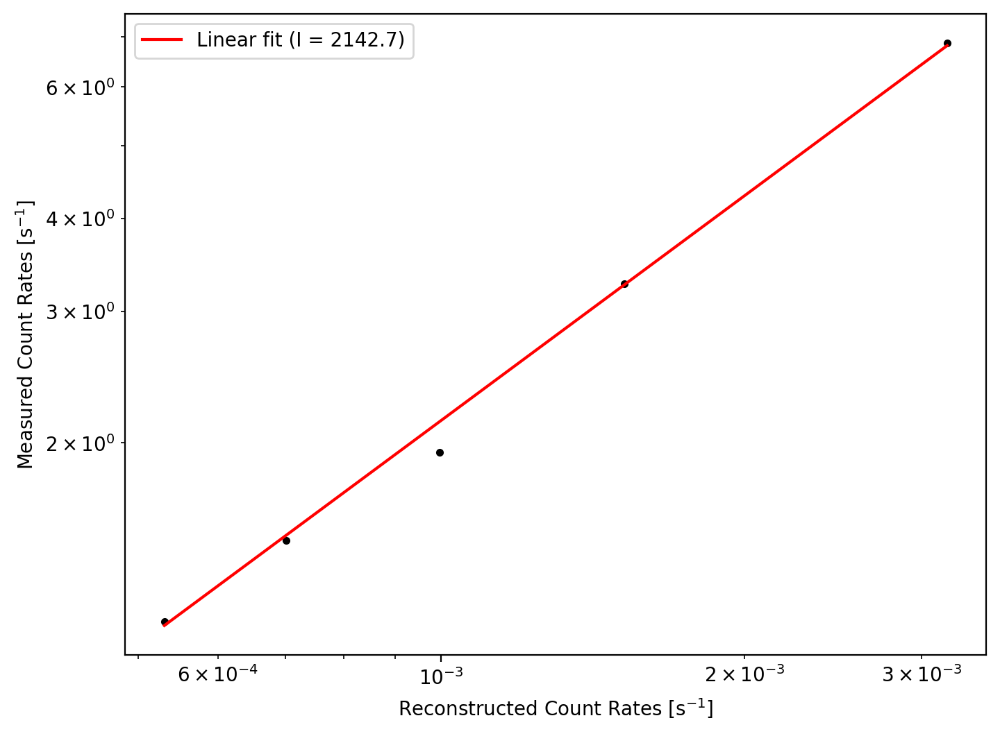

In [5]:
diffFluxReconstructor = DiffFluxReconstructor()
RollingPowerLaw = diffFluxReconstructor.RollingPowerLaw
responseFunctions = diffFluxReconstructor.responseFunctions
responseFunctionEnergies = diffFluxReconstructor.responseFunctionEnergies

countRatesDF = listSEPData[4]
countRates = countRatesDF[countRatesDF.index == pd.Timestamp(datetime(2024, 5, 12, 0, 0), tz="UTC")]
countRates = torch.tensor(countRates.values, dtype=torch.float32)
countRates = countRates - bkgMean + 6 * bkgStd
predParameters, predParameterErrors, predParameterSamples, maskDict = diffFluxReconstructor(countRates, bkgMean=bkgMean)
print(predParameterSamples[0, 1:, 0])

reconstructedCountRates = FluxParametersToCounts(RollingPowerLaw, predParameterSamples[:, 1:, 0], responseFunctions, responseFunctionEnergies)
X = reconstructedCountRates.unsqueeze(-1)
Y = countRates.unsqueeze(-1)
predIntensity = torch.matmul(torch.transpose(X, 1, 2), Y).squeeze(-1) / torch.bmm(torch.transpose(X, 1, 2), X).squeeze(-1)
print(predIntensity.squeeze())

X = X.squeeze()
Y = Y.squeeze()
predIntensity = predIntensity.squeeze()

plt.figure(figsize=(8, 6), dpi=200)
plt.plot(X, Y, ".", color="black")
plt.plot(X, predIntensity*X, color="red", label=f"Linear fit (I = {predIntensity.item():.1f})")
plt.xlabel(r"Reconstructed Count Rates [s$^{-1}$]")
plt.ylabel(r"Measured Count Rates [s$^{-1}$]")
plt.xscale("log")
plt.yscale("log")
plt.legend()
plt.savefig(f"{GetRootPath()}/Images/LinearFitExample.png")
plt.show()